In [1]:
# 구글드라이브와 연결후 드라이브에 폴더 업로드함
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
# 디렉토리 확인함
import os

img_dir = '/content/drive/MyDrive/Colab Notebooks/mydrive/data'
os.listdir(img_dir)

['.DS_Store', 'Free', 'Full']

In [3]:
# skimage imagecollection 통해서 해당위치에 있는 이미지파일들을 가져옴
import skimage.io as io
Free_images = io.ImageCollection('/content/drive/MyDrive/Colab Notebooks/mydrive/data/Free/*')
Full_images = io.ImageCollection('/content/drive/MyDrive/Colab Notebooks/mydrive/data/Full/*')

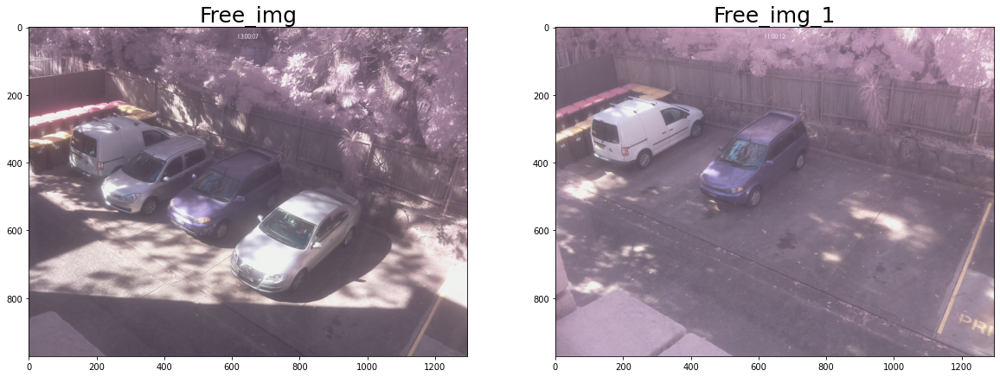

In [4]:
import matplotlib.pyplot as plt

# Free_images 의 이미지 중 하나를 시각화 
plt.figure(figsize=(20,20))
free_img = Free_images[100]
plt.subplot(1,2,1)
plt.title('Free_img', fontsize=25)
plt.imshow(free_img)

free_img_1 = Free_images[50]
plt.subplot(1,2,2)
plt.title('Free_img_1', fontsize=25)
plt.imshow(free_img_1);

# 비어있는 공간이 어디가 비어있는지는 라벨링이 되어 있지는 않음
# 어느 공간이 비어있는지는 알 수 없지만 feature activation map을 통해서 어느 공간이 비어있는지를 시각화 해볼 예정

In [5]:
print(free_img.shape)     # 하나의 free_img shape 확인
print(len(Free_images))   # 전체 Free 이미지 갯수 확인

(972, 1296, 3)
1067


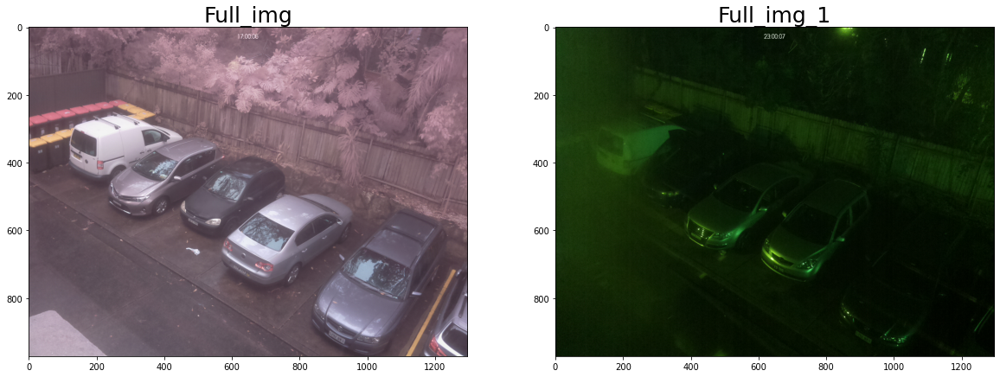

In [6]:
# Full_images 의 이미지 중 하나를 시각화 
plt.figure(figsize=(20,20))

full_img = Full_images[99]
plt.subplot(1,2,1)
plt.title('Full_img', fontsize=25)
plt.imshow(full_img)

full_img_1 = Full_images[100]
plt.subplot(1,2,2)
plt.title('Full_img_1', fontsize=25)
plt.imshow(full_img_1);

In [7]:
print(full_img.shape)     # 하나의 Full_img shape 확인
print(len(Full_images))   # 전체 Full 이미지 갯수 확인

(972, 1296, 3)
2195


In [ ]:
x = np.arange(3)
years = ['2017', '2018', '2019']
values = [100, 400, 900]

plt.bar(x, values, width=0.6, align='edge', color="springgreen",
        edgecolor="gray", linewidth=3, tick_label=years, log=True)
plt.show()


In [21]:
%config InlineBackend.figure_format = 'retina'

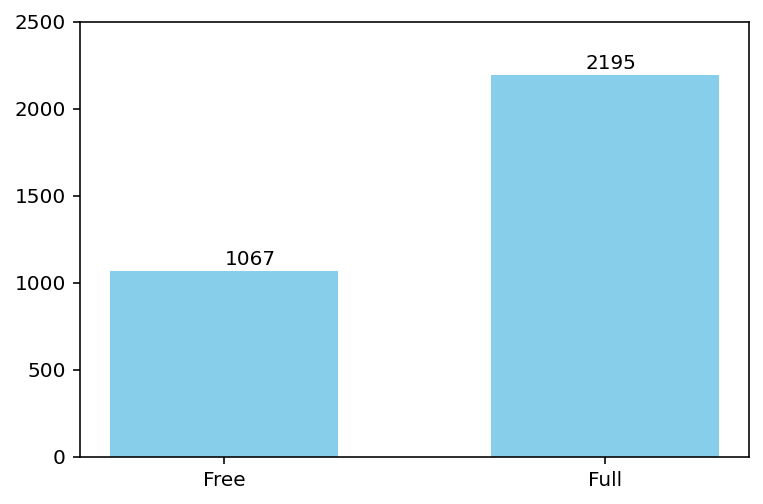

In [79]:
import numpy as np

x = np.arange(2)
years = ['Free', 'Full']
values = [len(Free_images), len(Full_images)]

plt.bar(x, values, width=0.6, color='skyblue')
plt.text(0.0003,1100,'1067')
plt.text(0.95,2230,'2195')
plt.xticks(x, years)
plt.ylim([0,2500])     

plt.show()

In [8]:
print(len(Free_images), len(Full_images))

1067 2195


In [82]:
print(len(Free_images) + len(Full_images))

3262


In [85]:
# 타겟 분포 확인 및 베이스라인
print(len(Free_images)/(len(Free_images) + len(Full_images))*100)
print(len(Full_images)/(len(Free_images) + len(Full_images))*100)

32.709993868792154
67.29000613120785


# basic CNN

In [131]:
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

train_datagen_1 = ImageDataGenerator(rotation_range=20,
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   brightness_range=[0.8, 1.2],
                                   shear_range=0.01,
                                   zoom_range=[0.9, 1.1],
                                   validation_split=0.1,
                                   rescale = 1./255)

In [132]:
'''
rescale: 이미지의 픽셀 값을 조정
rotation_range: 이미지 회전
width_shift_range: 가로 방향으로 이동
height_shift_range: 세로 방향으로 이동
shear_range: 이미지 굴절
zoom_range: 이미지 확대
horizontal_flip: 횡 방향으로 이미지 반전
fill_mode: 이미지를 이동이나 굴절시켰을 때 빈 픽셀 값에 대하여 값을 채우는 방식
'''

'\nrescale: 이미지의 픽셀 값을 조정\nrotation_range: 이미지 회전\nwidth_shift_range: 가로 방향으로 이동\nheight_shift_range: 세로 방향으로 이동\nshear_range: 이미지 굴절\nzoom_range: 이미지 확대\nhorizontal_flip: 횡 방향으로 이미지 반전\nfill_mode: 이미지를 이동이나 굴절시켰을 때 빈 픽셀 값에 대하여 값을 채우는 방식\n'

In [133]:
val_datagen_1 = ImageDataGenerator(validation_split=0.1,
                                 rescale = 1./255)

In [134]:
train_gen_1 = train_datagen_1.flow_from_directory(img_dir,  # 디렉토리에 있는 이미지들을 다 불러오는 함수
                                              target_size=(224,224), # 사이즈 조정 -> 리사이징
                                              classes=['Full','Free'], # 클래스 나눔
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True, # 무작위 섞음 True
                                              subset='training')

Found 2937 images belonging to 2 classes.


In [135]:
val_gen_1 = val_datagen_1.flow_from_directory(img_dir,
                                          target_size=(224,224),
                                          classes=['Full','Free'],
                                          class_mode='categorical',
                                          batch_size=32,
                                          shuffle=False,
                                          subset='validation')

Found 325 images belonging to 2 classes.


In [136]:
print(val_gen_1.class_indices)    # 클래스 확인

{'Full': 0, 'Free': 1}


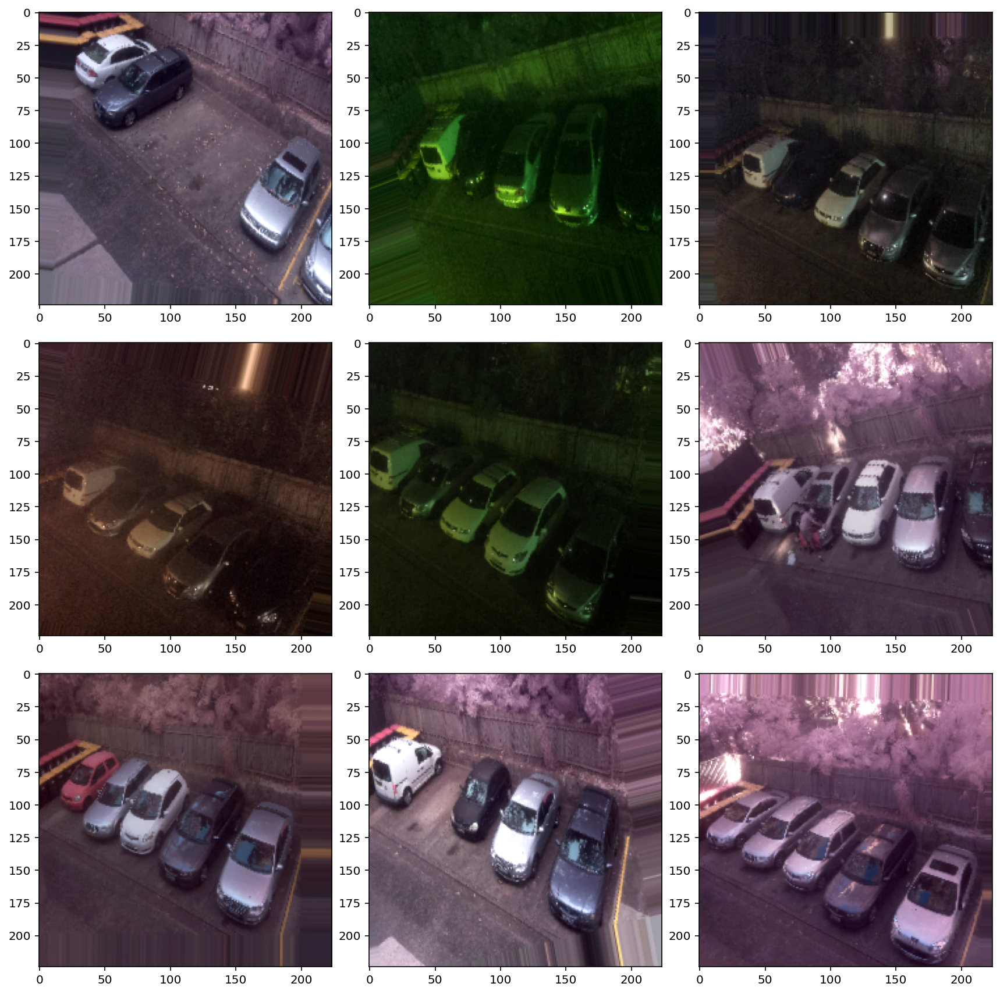

In [137]:
plt.figure(figsize=(12, 12))
for i in range(0, 9):
    plt.subplot(3, 3, i+1)
    for X_batch, Y_batch in train_gen_1:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

In [138]:
import tensorflow as tf
import random
import numpy as np

from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, Dense, Conv2D, MaxPooling2D, Dropout
from keras.models import Model, load_model
from keras.optimizers import RMSprop, SGD, Adam, Nadam
from keras.callbacks import ModelCheckpoint, EarlyStopping

random.seed(1)
tf.random.set_seed(1)
np.random.seed(1)
os.environ["PYTHONHASHSEED"] = str(1)
os.environ['TF_DETERMINISTIC_OPS'] = str(1)

In [139]:
model = Sequential()

model.add(Conv2D(16, (3,3), activation='relu', input_shape=(224, 224, 3)))
model.add(Dropout(0.3))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(32, (3,3), activation='relu'))
model.add(Dropout(0.3))
model.add(MaxPooling2D(2,2)) 
model.add(Conv2D(1280, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2)) 

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 222, 222, 16)      448       
_________________________________________________________________
dropout_2 (Dropout)          (None, 222, 222, 16)      0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 111, 111, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 109, 109, 32)      4640      
_________________________________________________________________
dropout_3 (Dropout)          (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 52, 52, 1280)     

In [140]:
x = model.output
x = GlobalAveragePooling2D()(x) # 1차원으로 데이터를 펴준다.
output = Dense(2, # 마지막 결과값은 Full:0, Free:1 두개의 이진 결과값이므로 Dense 는 2를 준다.
               activation='softmax')(x)

model = Model(inputs=model.input,
              outputs=output)

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])
model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6_input (InputLayer)  [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 222, 222, 16)      448       
_________________________________________________________________
dropout_2 (Dropout)          (None, 222, 222, 16)      0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 111, 111, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 109, 109, 32)      4640      
_________________________________________________________________
dropout_3 (Dropout)          (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 54, 54, 32)        0   

In [141]:
# Train the model
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
mc = ModelCheckpoint('Vanilla CNN_04.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)

history = model.fit_generator(
    train_gen_1,
    validation_data=val_gen_1,
    epochs=20,
    callbacks = [es, mc])

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
92/92 [==============================] - 704s 8s/step - loss: 0.6411 - acc: 0.6400 - val_loss: 0.5535 - val_acc: 0.7169

Epoch 00001: val_acc improved from -inf to 0.71692, saving model to Vanilla CNN_04.h5
Epoch 2/20
92/92 [==============================] - 699s 8s/step - loss: 0.5638 - acc: 0.6905 - val_loss: 0.5424 - val_acc: 0.7569

Epoch 00002: val_acc improved from 0.71692 to 0.75692, saving model to Vanilla CNN_04.h5
Epoch 3/20
92/92 [==============================] - 697s 8s/step - loss: 0.5227 - acc: 0.7355 - val_loss: 0.5735 - val_acc: 0.6677

Epoch 00003: val_acc did not improve from 0.75692
Epoch 4/20
92/92 [==============================] - 688s 7s/step - loss: 0.5352 - acc: 0.7297 - val_loss: 0.6166 - val_acc: 0.6215

Epoch 00004: val_acc did not improve from 0.75692
Epoch 5/20
92/92 [==============================] - 686s 7s/step - loss: 0.5192 - acc: 0.7511 - val_loss: 0.6225 - val_acc: 0.6185

Epoch 00005: val_acc did not improve from 0.75692
Epoch 6/20
92/9

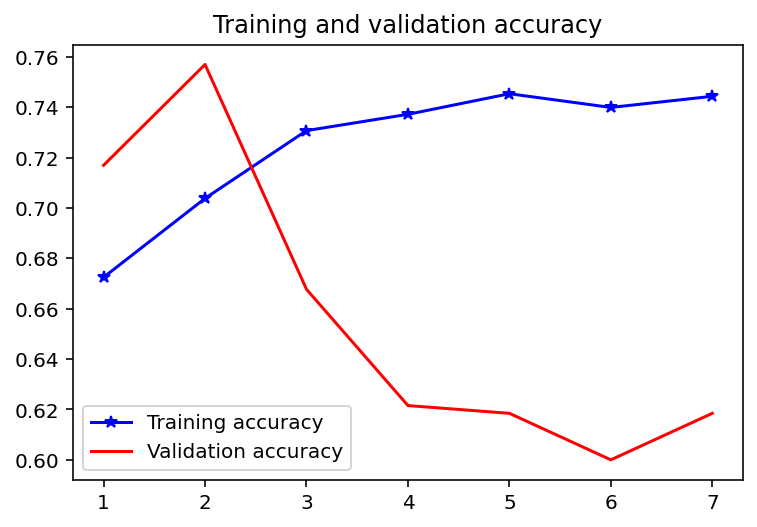

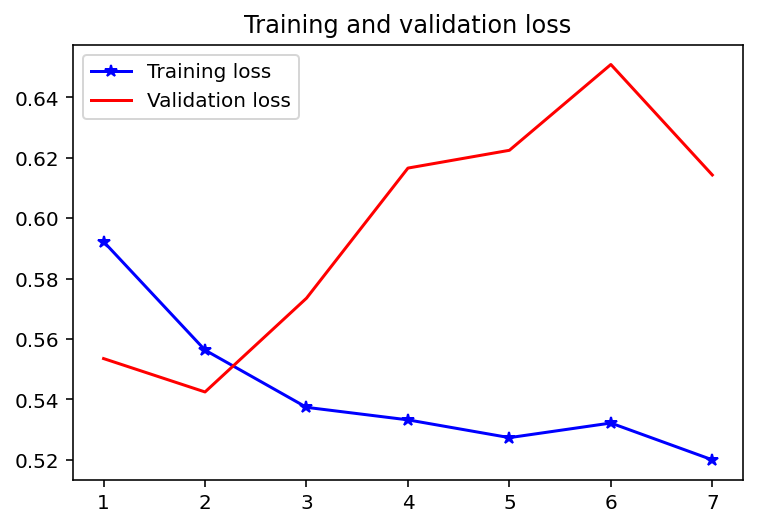

In [142]:
train_acc = history.history['acc']
val_acc = history.history['val_acc']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

plt.ylim = [0,1]
plt.plot(epochs, train_acc, 'b*-', label = 'Training accuracy')
plt.plot(epochs, val_acc, 'r', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, train_loss, 'b*-', label = 'Training loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [143]:
# 실행
score = model.evaluate(val_gen_1,batch_size=32)
score
print('Score Accuracy : {:.2f}%'.format(score[1]*100))

11/11 [==============================] - 26s 2s/step - loss: 0.6143 - acc: 0.6185
Score Accuracy : 61.85%


In [144]:
model = load_model('Vanilla CNN_04.h5')

last_weight = model.layers[-1].get_weights()[0] # (1280, 2)

new_model = Model(inputs=model.input,
                  outputs=(model.layers[-3].output, 
                           # GlobalAveragePooling2D()(x) 하기전 결과값, Convolution과 Activation까지한 layer
                           # Convolution layer까지가 공간적인 특징을 가진 layer라서 여기까지만된 layer 사용함.
                           model.layers[-1].output)) 
                           # output 2개짜리(모든 layer 통과한 결과값)

new_model.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6_input (InputLayer)  [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 222, 222, 16)      448       
_________________________________________________________________
dropout_2 (Dropout)          (None, 222, 222, 16)      0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 111, 111, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 109, 109, 32)      4640      
_________________________________________________________________
dropout_3 (Dropout)          (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 54, 54, 32)        0   

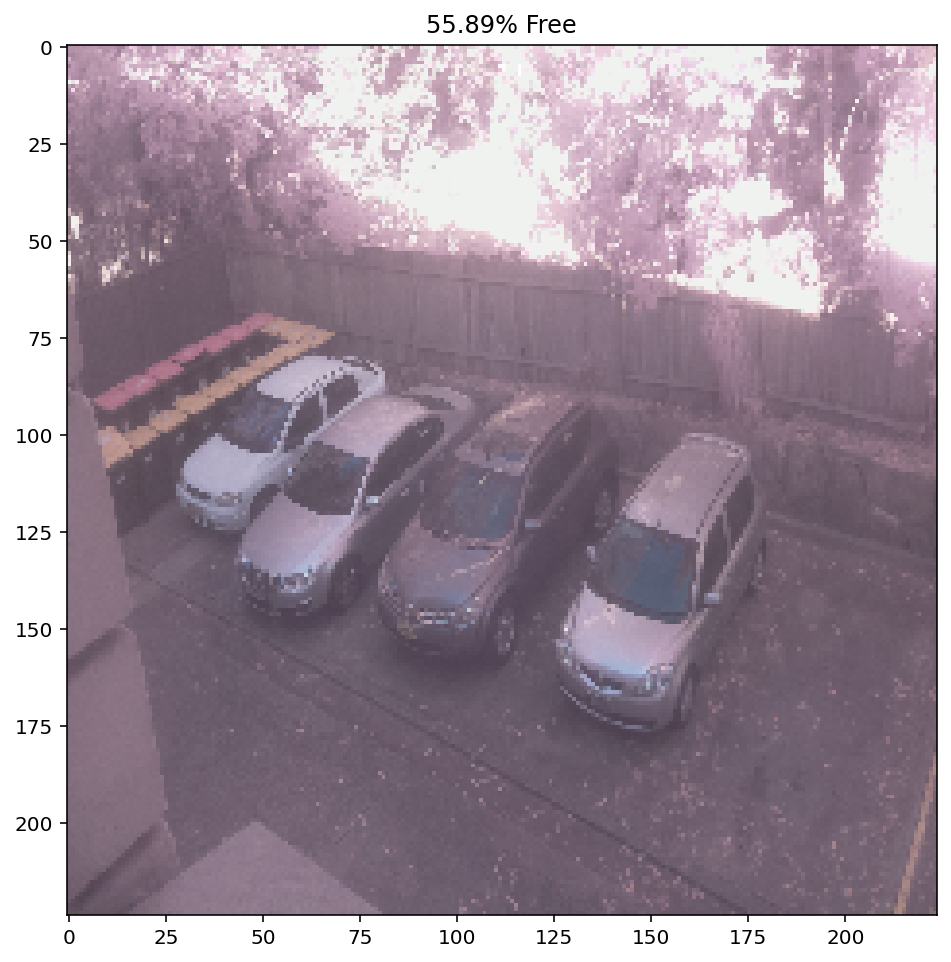

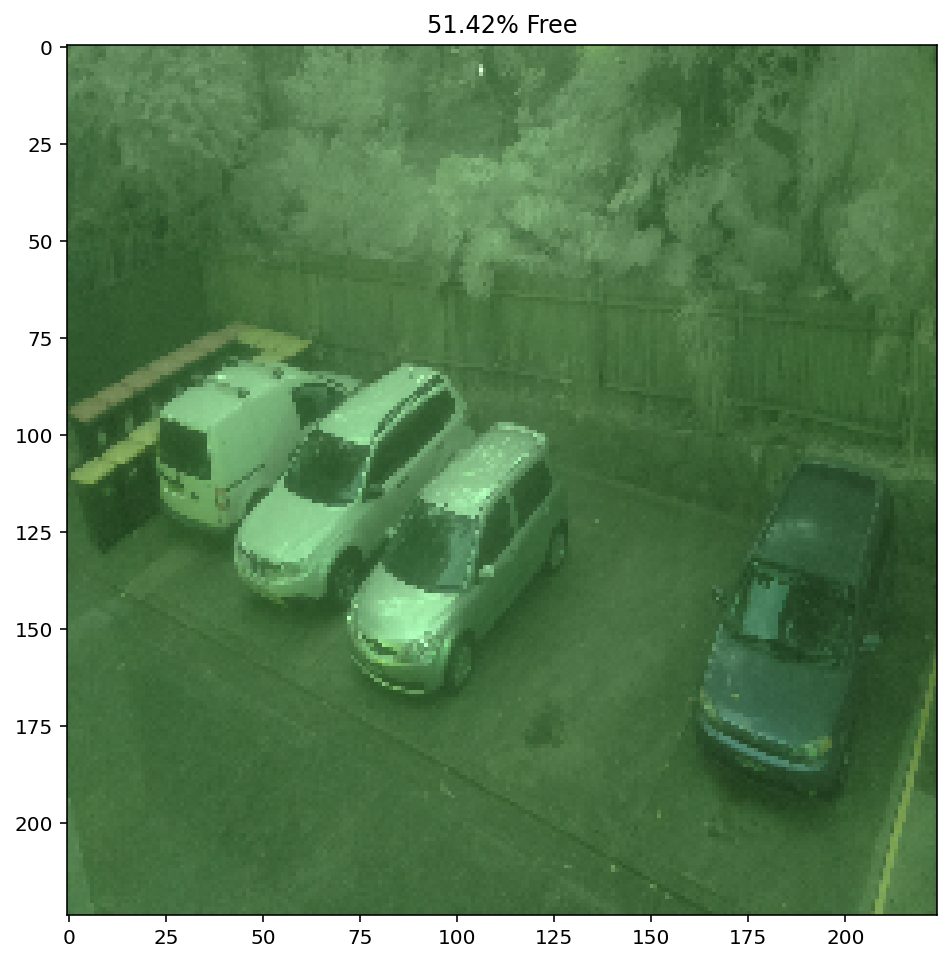

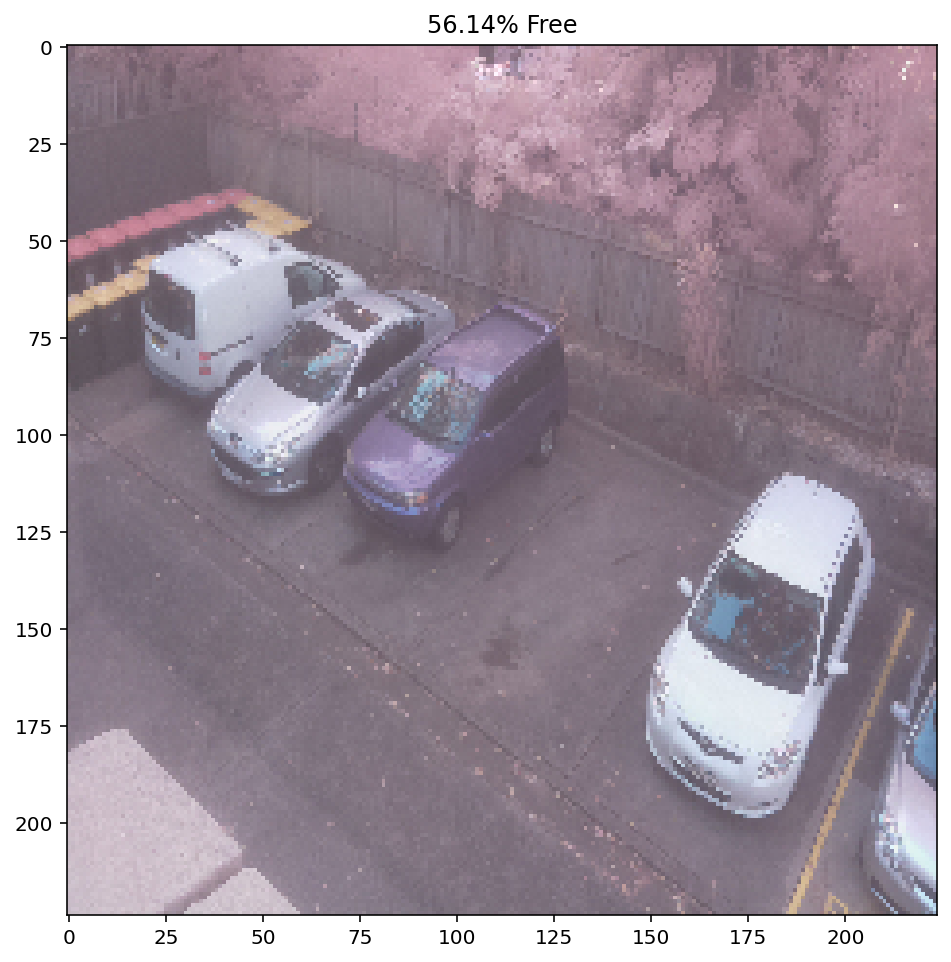

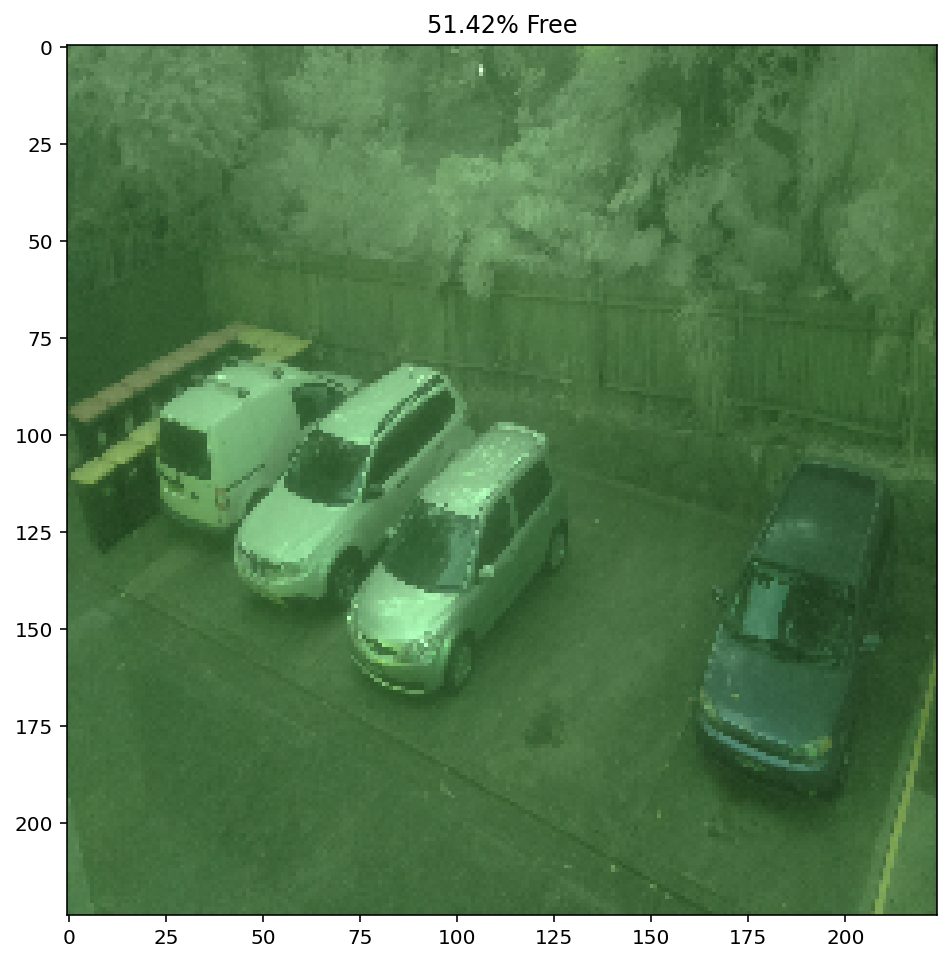

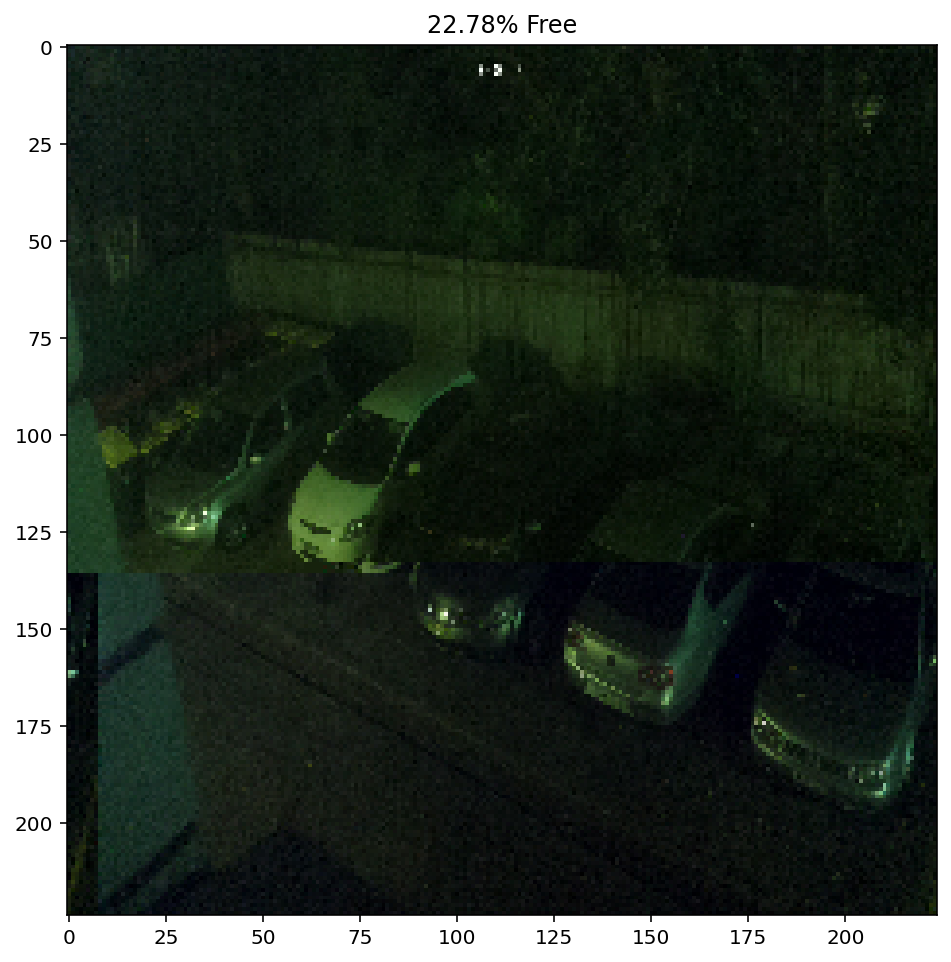

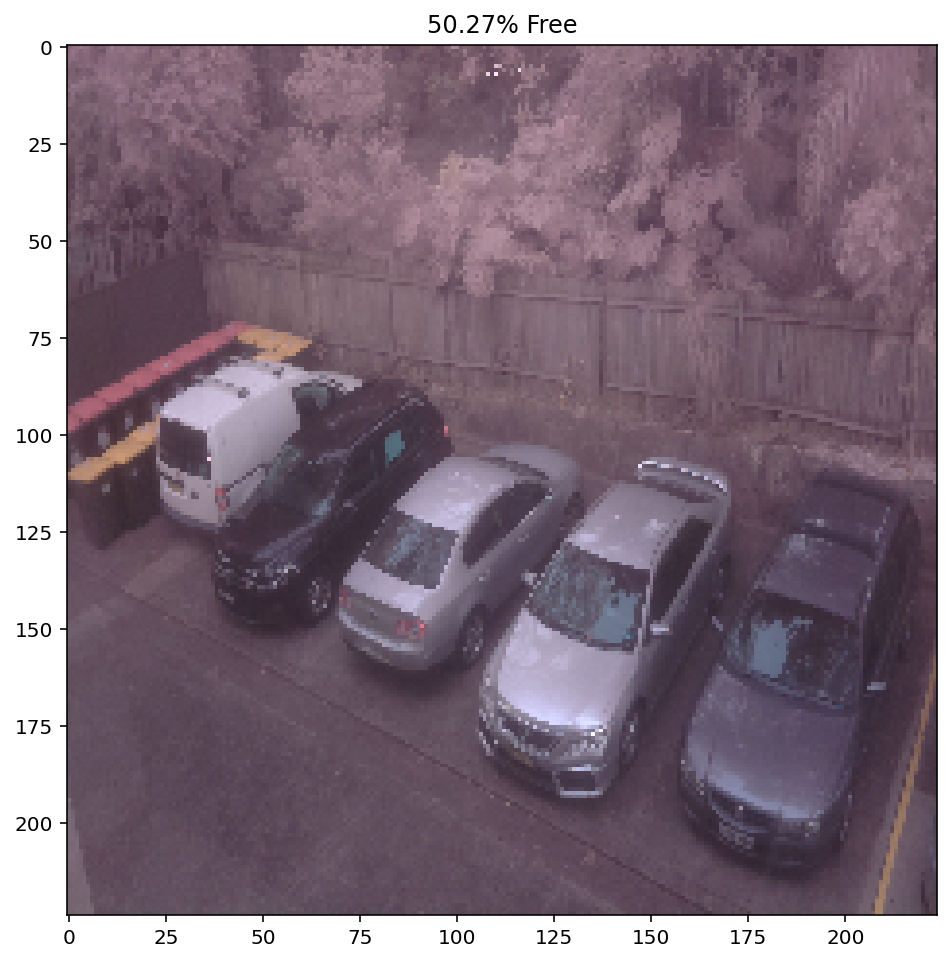

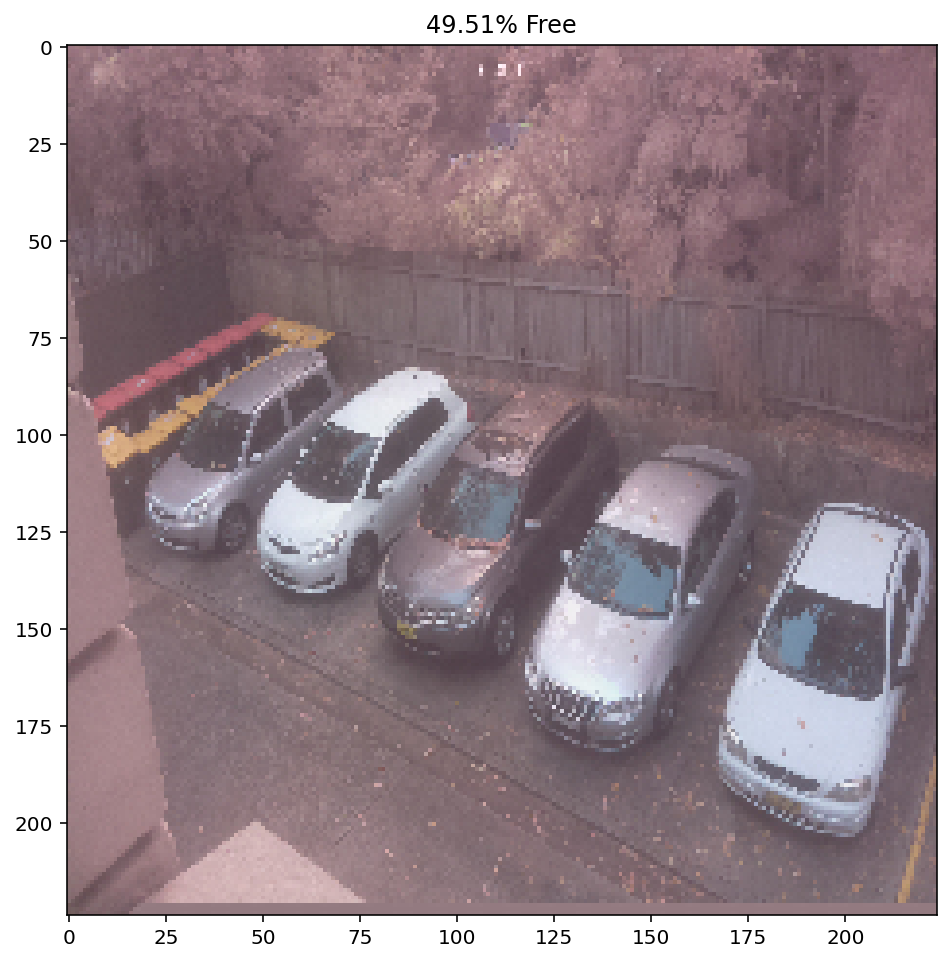

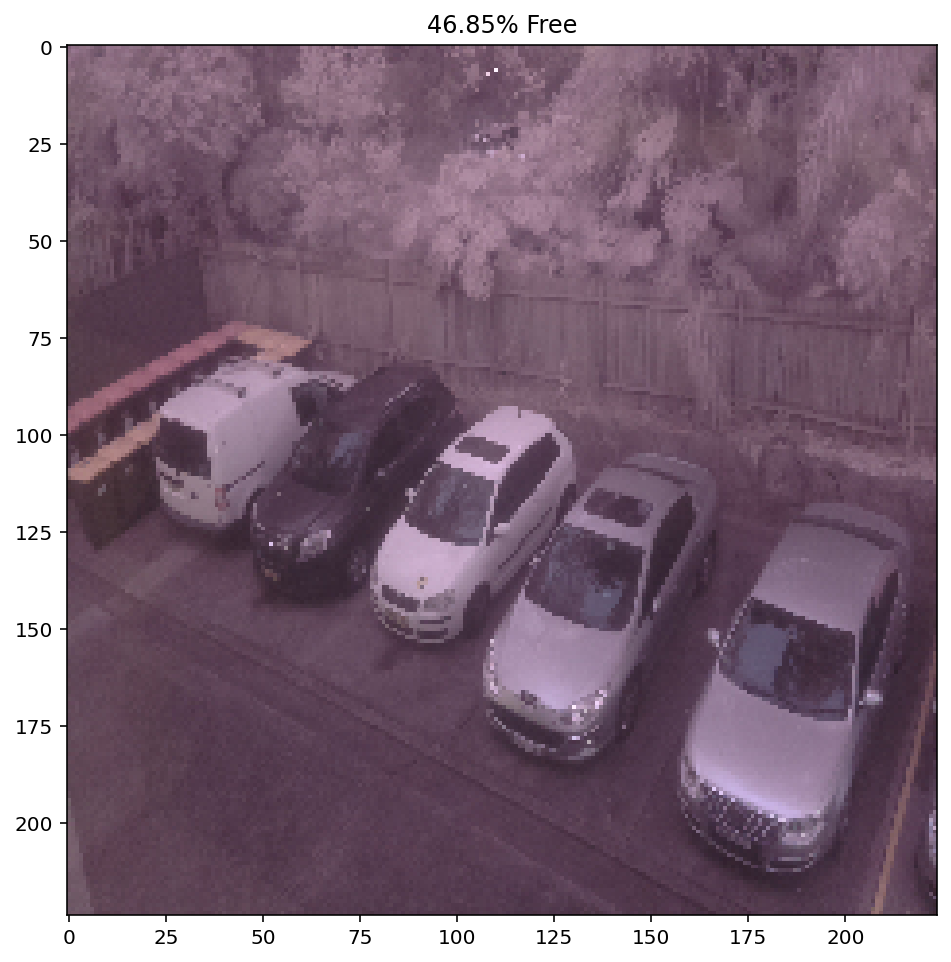

In [145]:
parking_list=['Free/img_129173058.jpg',
              'Free/img_815061601.jpg',
              'Free/img_723080007.jpg',
              'Free/img_815061601.jpg',
              'Full/img_127040601.jpg',
              'Full/img_809172559.jpg',
              'Full/img_129063058.jpg',
              'Full/img_822174600.jpg']

for parking in parking_list:
    test_img = img_to_array(load_img(os.path.join(img_dir, parking), target_size=(224, 224)))
    test_input = np.expand_dims(test_img.copy(), axis=0) # 사진 전처리
    test_input = test_input/255
    # print(test_input)
    pred = model.predict(test_input) # 예측
    
    plt.figure(figsize=(8,8))
    plt.title('%.2f%% Free' % (pred[0][1]*100))
    plt.imshow(test_img.astype(np.uint8))

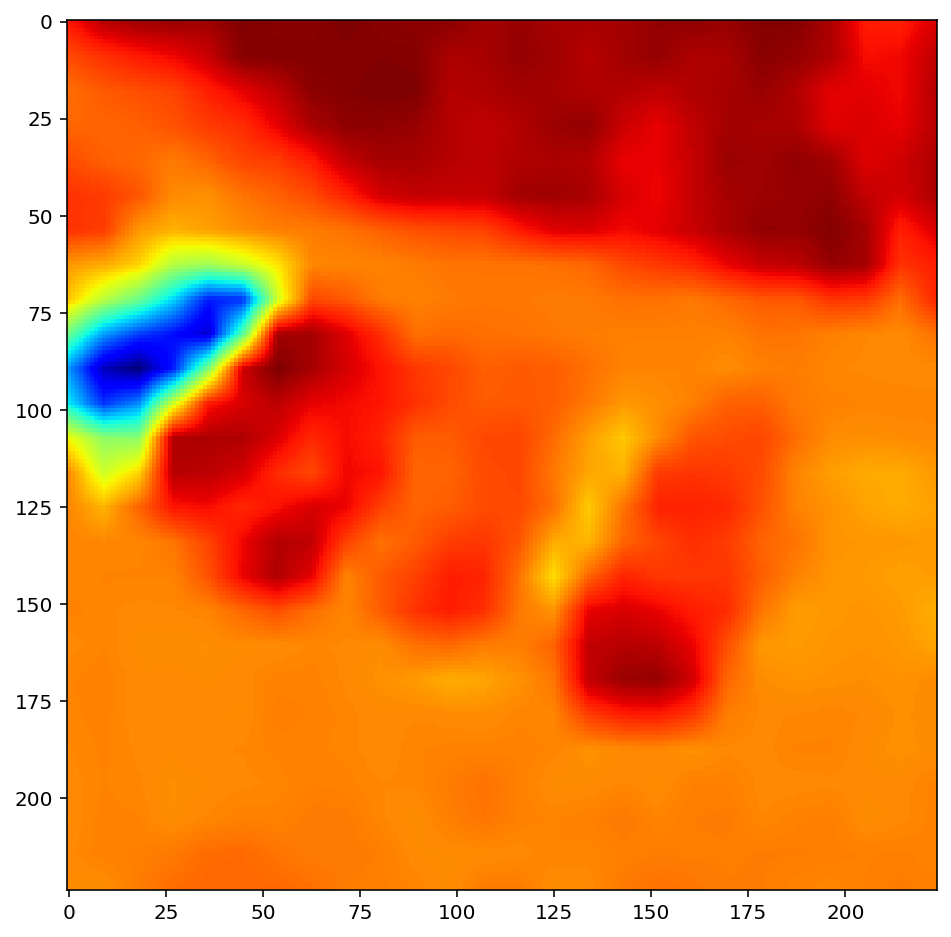

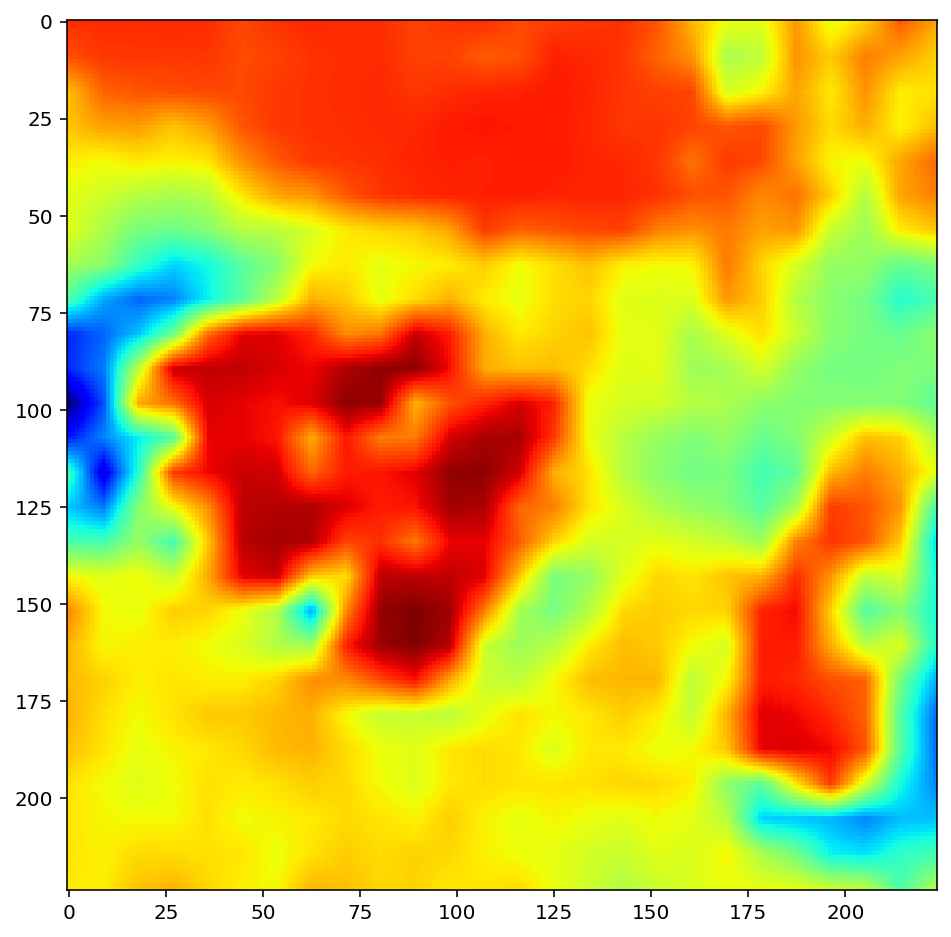

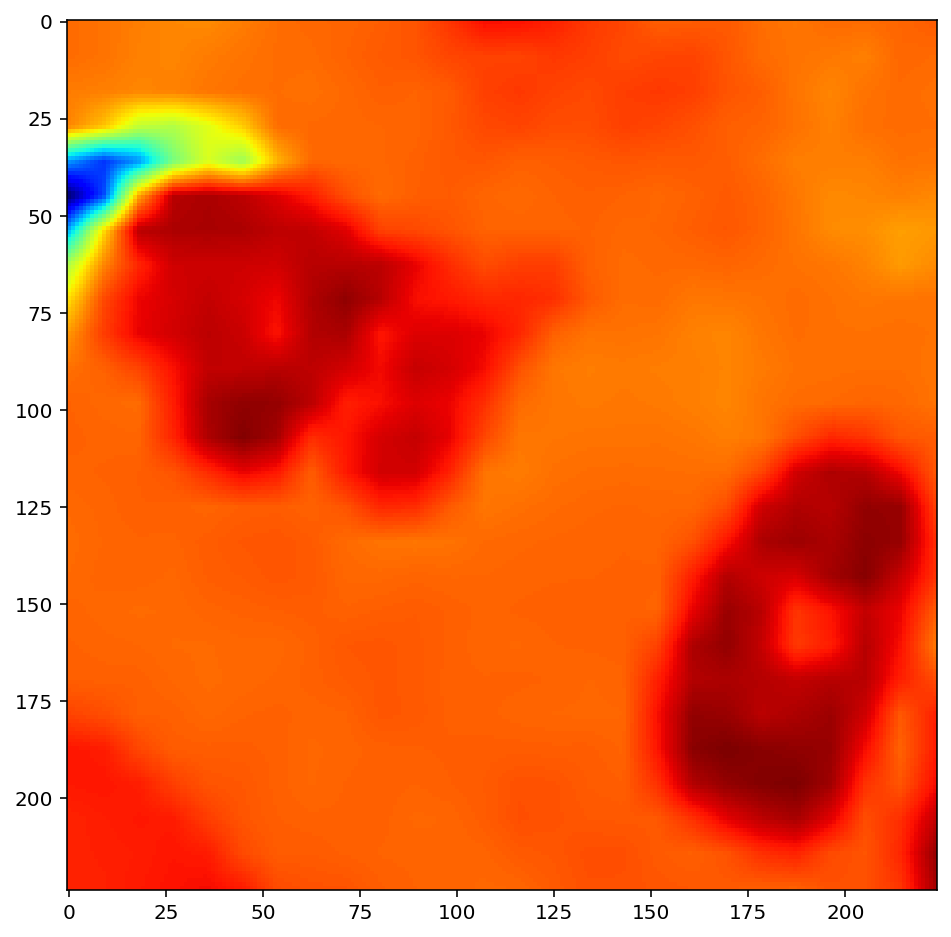

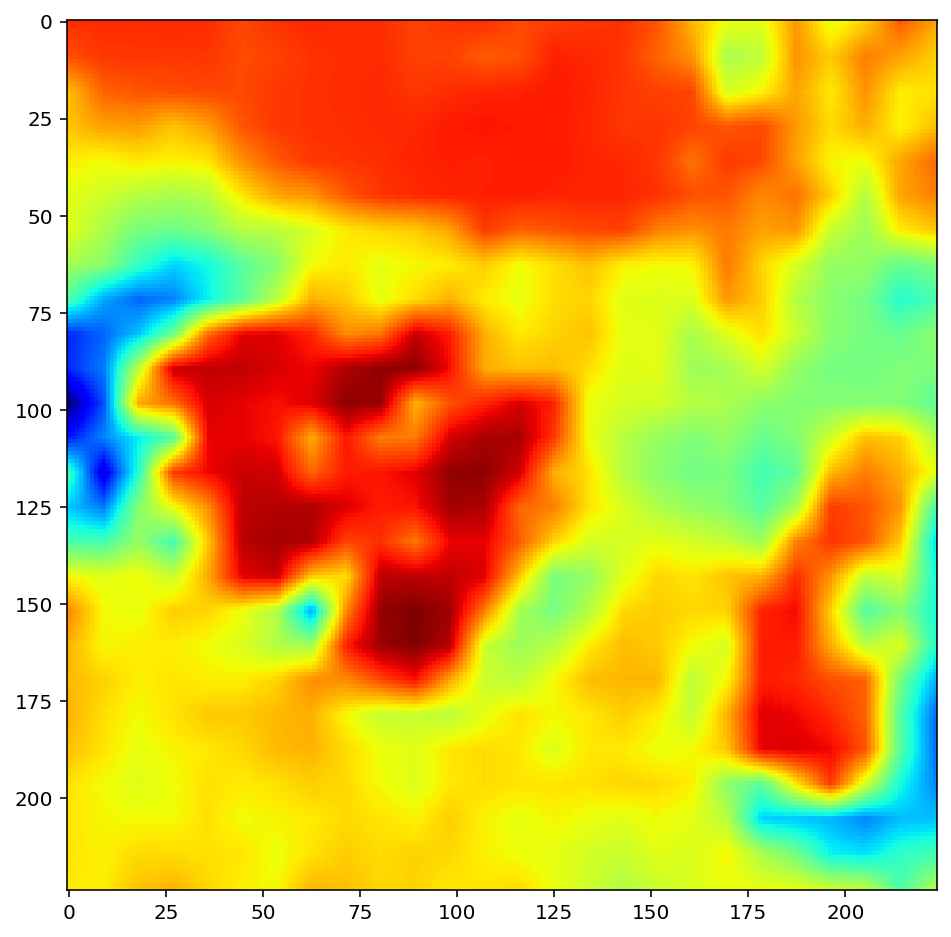

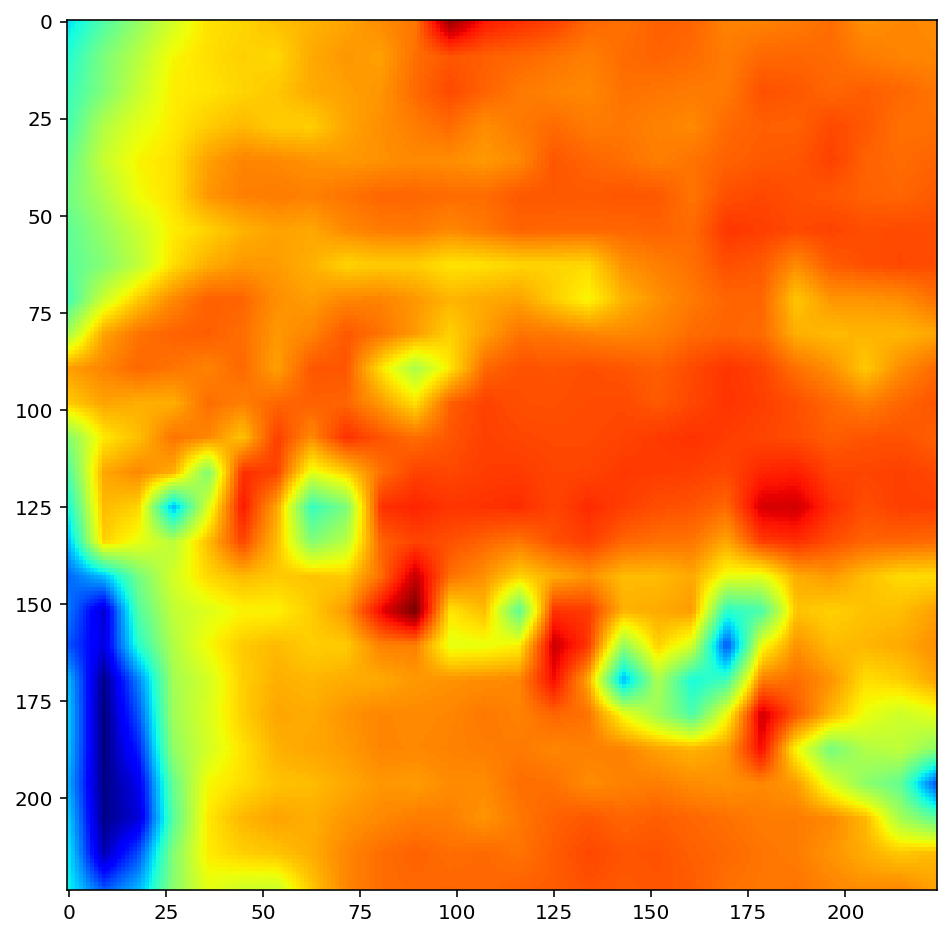

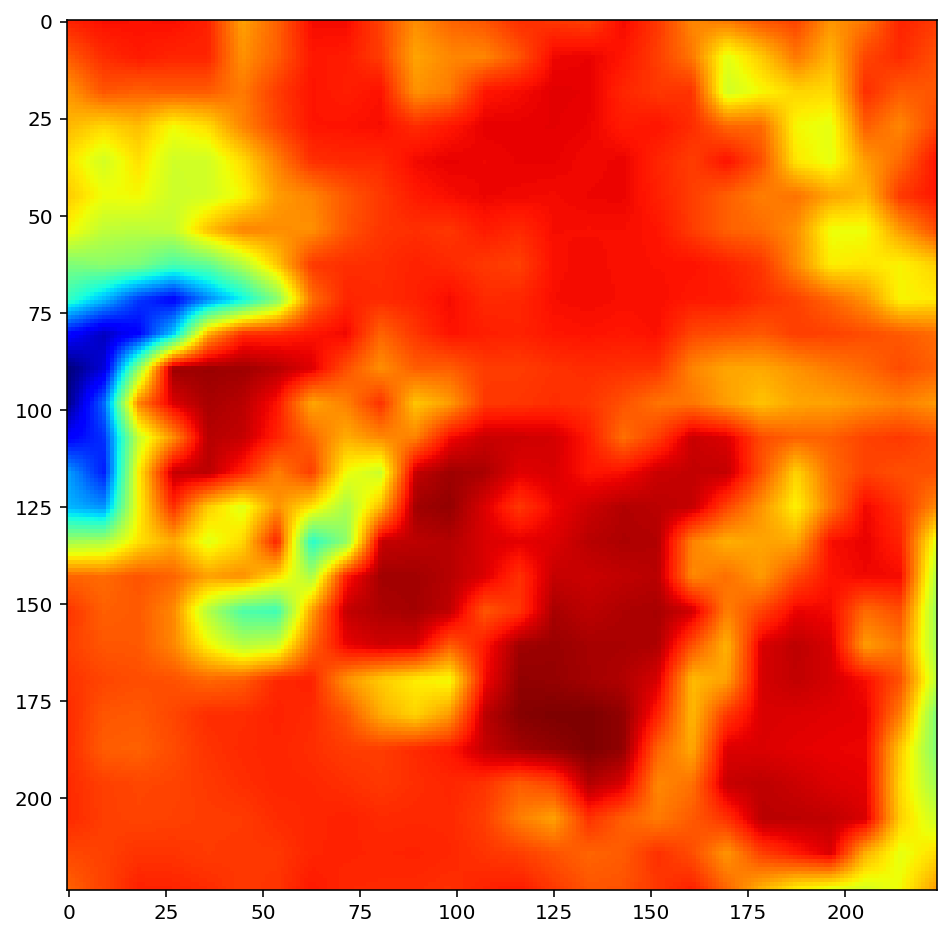

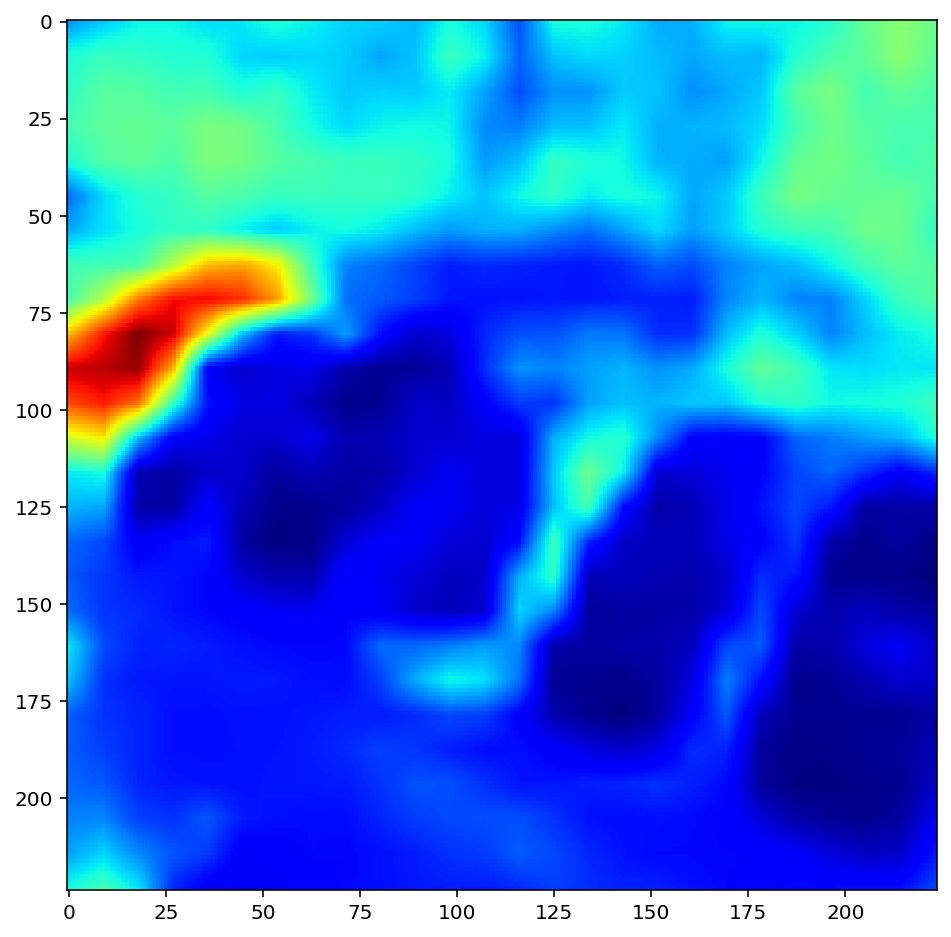

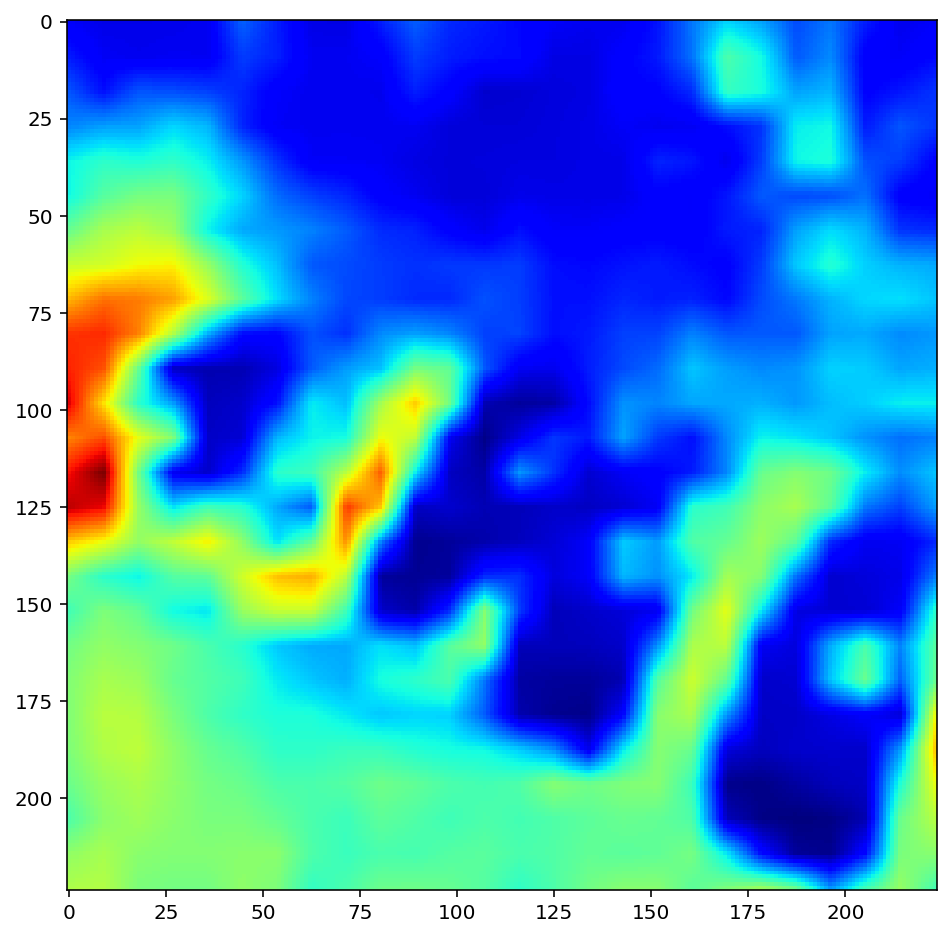

In [146]:
import scipy

for parking in parking_list:
    test_img = img_to_array(load_img(os.path.join(img_dir, parking), target_size=(224, 224)))
    test_input = np.expand_dims(test_img.copy(), axis=0) # 사진 전처리
    test_input = test_input/255
    pred = model.predict(test_input)
    
    # 이 다음 코드부터 Activation Map 코드
    last_conv_output, pred = new_model.predict(test_input)

    last_conv_output = np.squeeze(last_conv_output) # (26,26, 1280), squeeze 함수는 1짜리 axis는 없애줌.
    feature_activation_maps = scipy.ndimage.zoom(last_conv_output, (224/26, 224/26, 1), order=1) # 이미지를 확대
    # (26,26,64) -> (224,224,1280)
    # print(feature_activation_maps.shape)

    pred_class = np.argmax(pred) # 0: Full, 1:Free
    predicted_class_weights = last_weight[:, pred_class] # (1280, 1)
    # print(predicted_class_weights.shape)

    final_output = np.dot(feature_activation_maps.reshape((224*224,1280)), predicted_class_weights).reshape(224,224)
    # (224*224, 1280) dot_product(1280, 1) = (224*224, 1)
    
    plt.figure(figsize=(8,8))
    plt.imshow(final_output, cmap='jet')

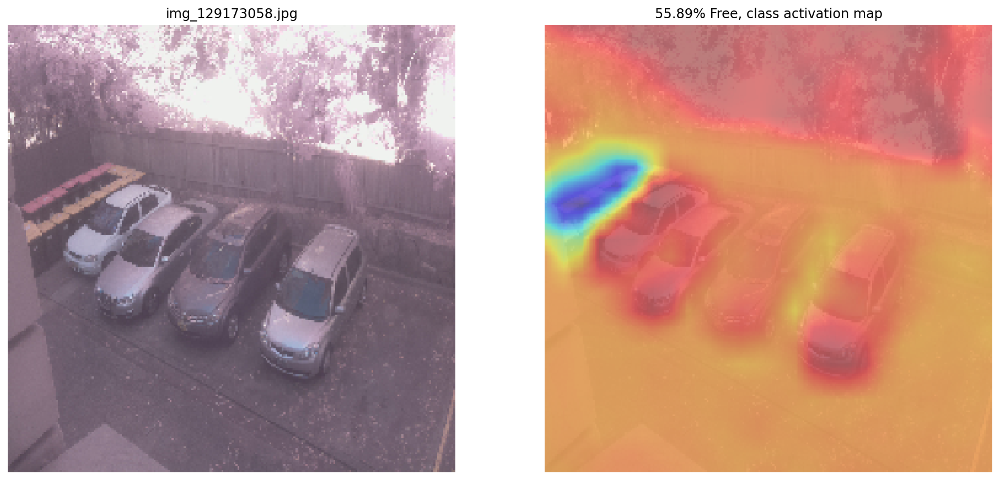

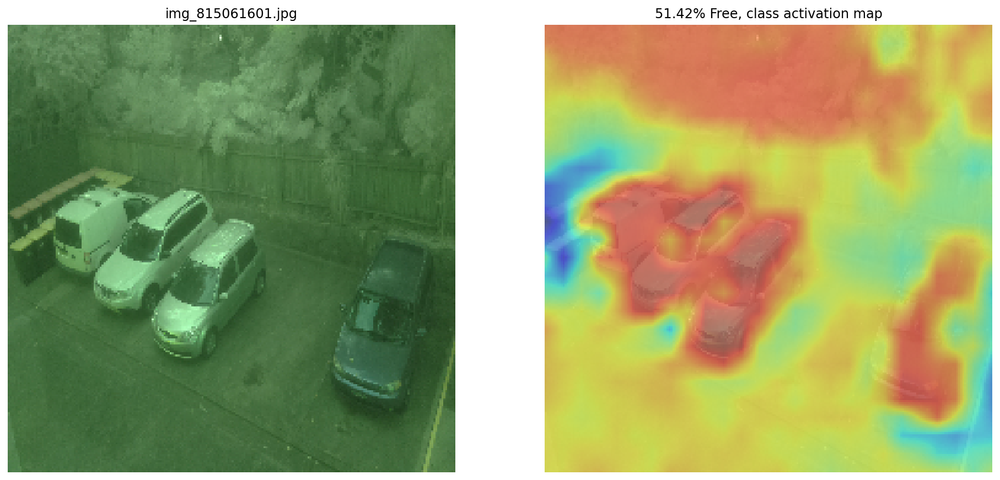

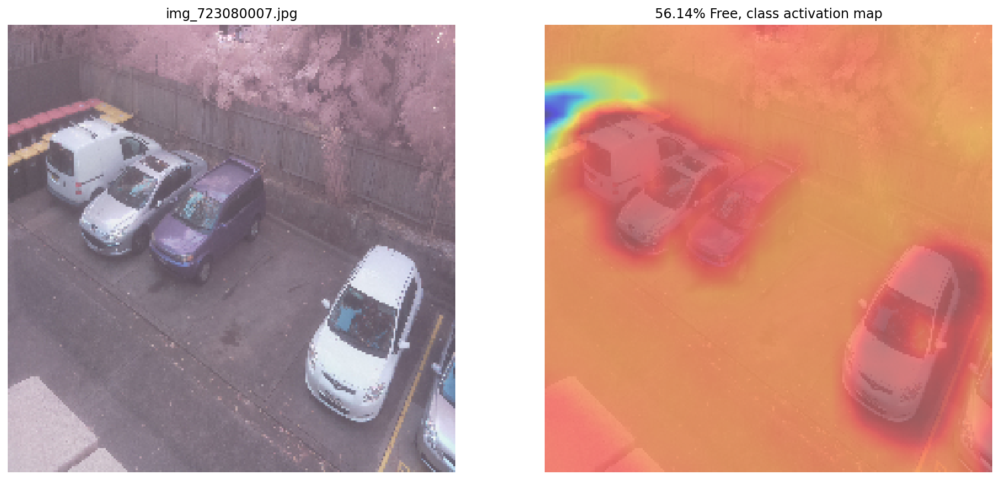

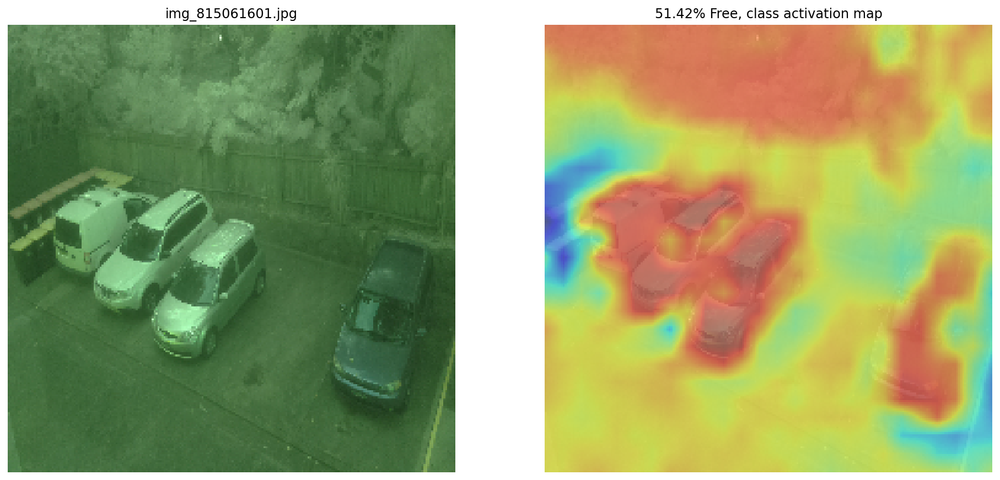

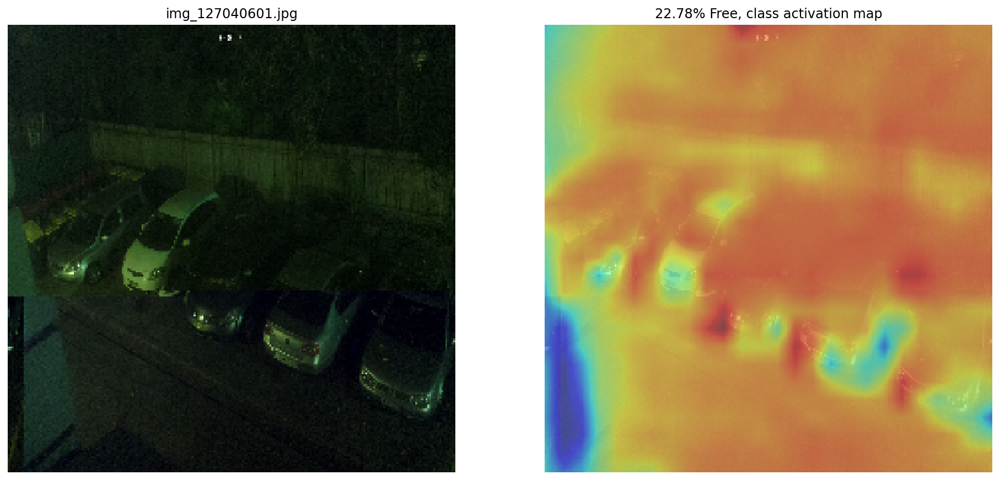

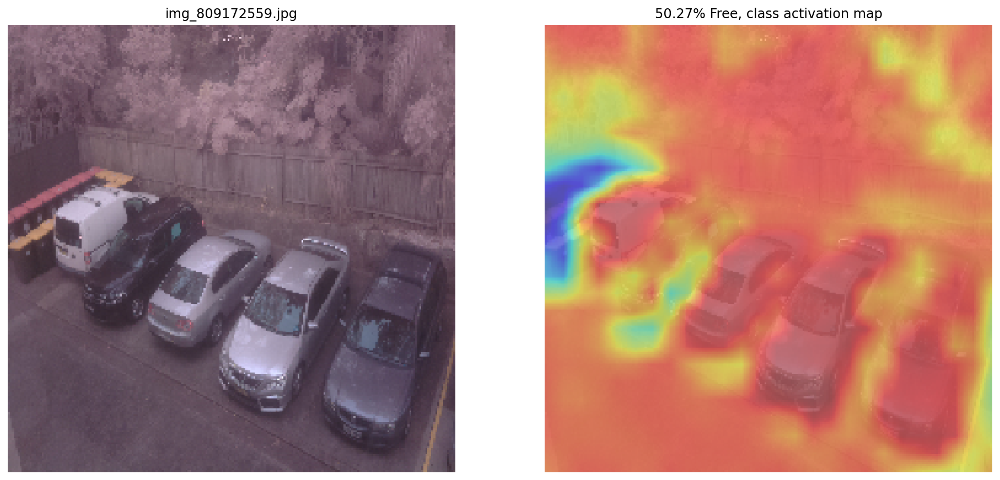

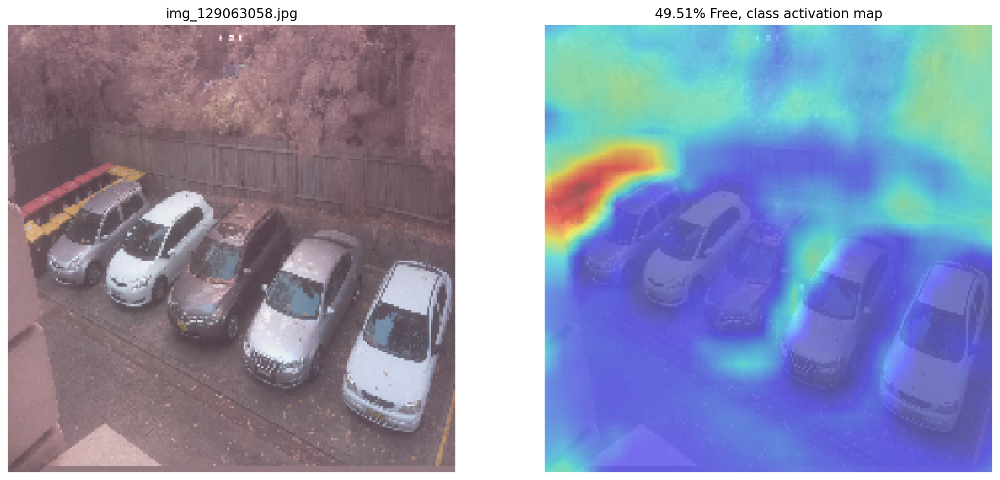

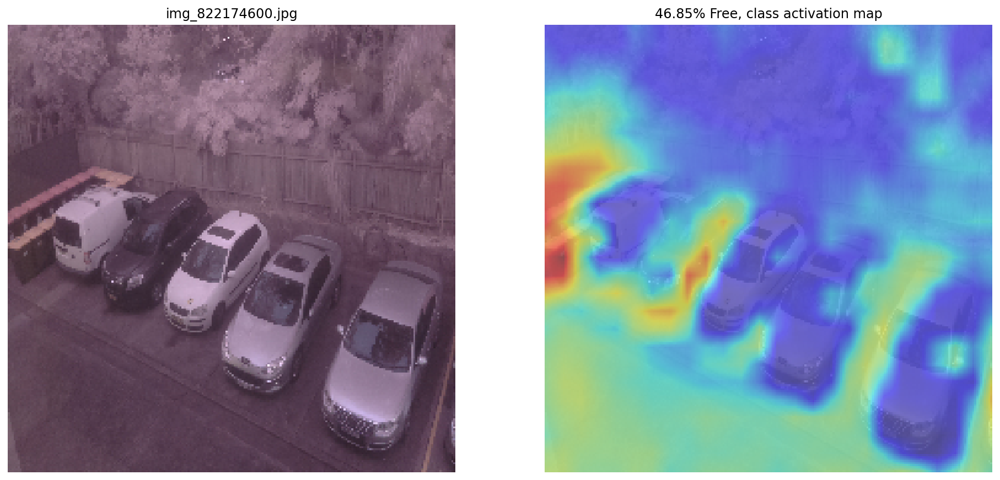

In [147]:
for parking in parking_list:
    test_img = img_to_array(load_img(os.path.join(img_dir, parking), target_size=(224, 224)))
    test_input = np.expand_dims(test_img.copy(), axis=0) # 사진 전처리
    test_input = test_input/255
    pred = model.predict(test_input)

    last_conv_output, pred = new_model.predict(test_input)

    last_conv_output = np.squeeze(last_conv_output) # (7,7, 1280)
    feature_activation_maps = scipy.ndimage.zoom(last_conv_output, (224/26, 224/26, 1), order=1) 
    # (7,7,1280) -> (224,224,1280)

    pred_class = np.argmax(pred) # 0: Full, 1:Free
    predicted_class_weights = last_weight[:, pred_class] # (1280, 1)

    final_output = np.dot(feature_activation_maps.reshape((224*224,1280)), predicted_class_weights).reshape(224,224)
    # (224*224, 1280) dot_product(1280, 1) = (224*224, 1)
    
    fig, ax = plt.subplots(nrows=1, ncols=2)
    fig.set_size_inches(16, 20)

    ax[0].imshow(test_img.astype(np.uint8))
    ax[0].set_title(parking.split('/')[1])
    ax[0].axis('off')

    ax[1].imshow(test_img.astype(np.uint8), alpha=0.5)
    ax[1].imshow(final_output, cmap='jet', alpha=0.5)
    ax[1].set_title('%.2f%% Free, class activation map' % (pred[0][1]*100))
    ax[1].axis('off')
    plt.show()